 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment - 03 : Classification</b>


This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.




In [ ]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

Training data shape:  (100, 2)
Training targets shape:  (100,)
Testing data shape:  (400, 2)
Testing targets shape:  (400,)
Accuracy with 0,1 labels:  0.9075


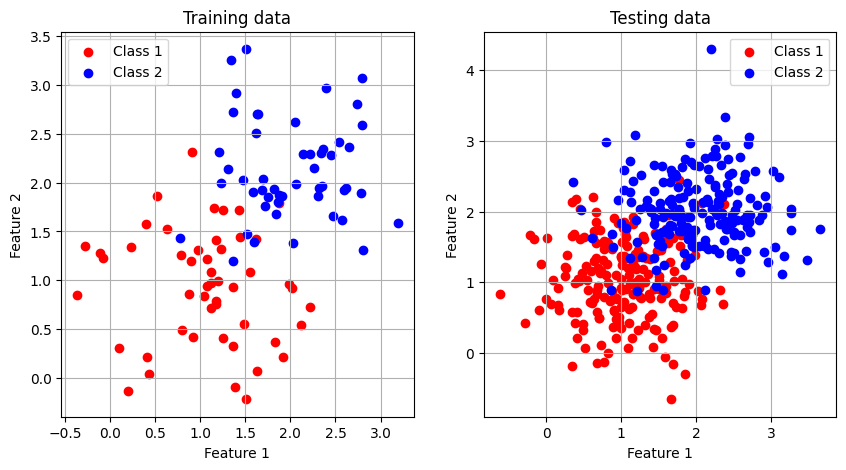

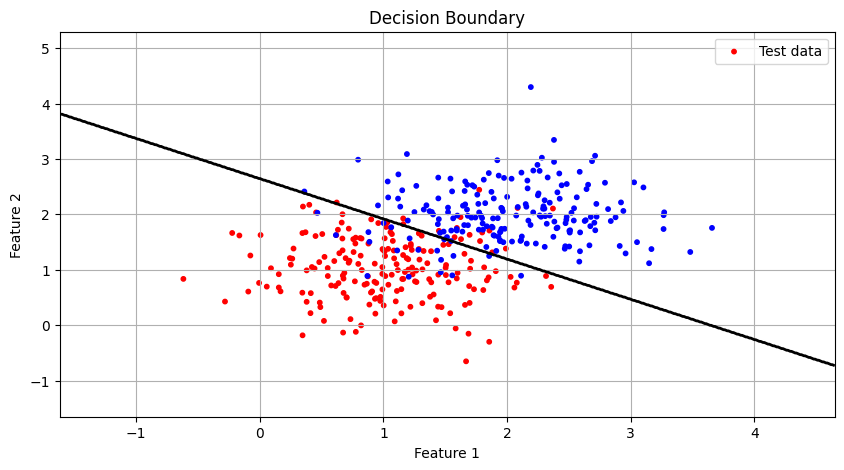

Accuracy with -1,1 labels:  0.9125


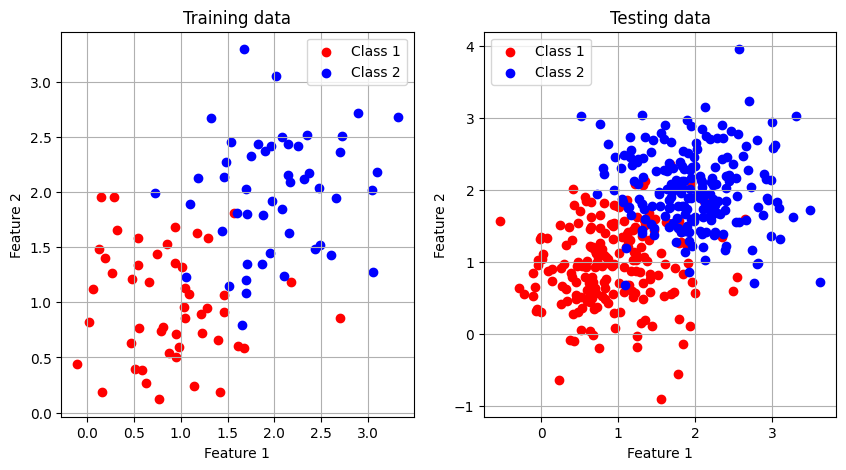

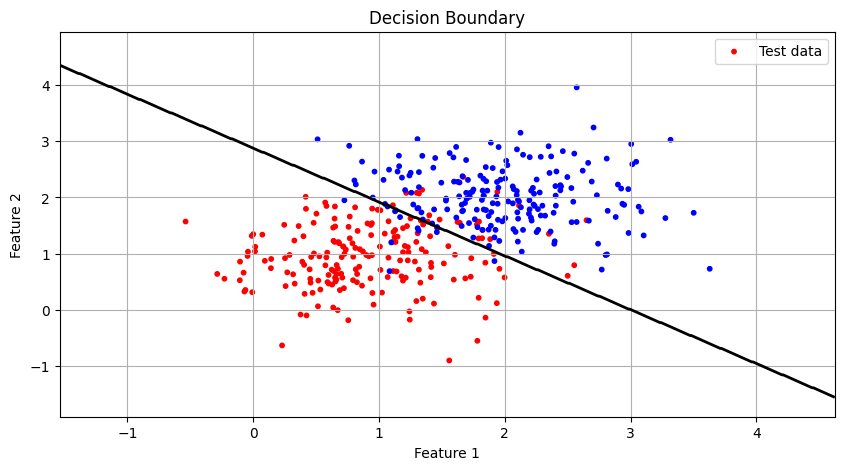

Training data shape:  (100, 2)
Training targets shape:  (100,)
Testing data shape:  (400, 2)
Testing targets shape:  (400,)
Accuracy with Laplace distribution and -1,1 labels:  0.855
Accuracy with Laplace distribution and 0,1 labels:  0.4925


In [ ]:

########################################
#Part-1)-a: Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)
class2_tr = np.random.multivariate_normal(mean2, cov, 50)
tr_data = np.concatenate((class1_tr, class2_tr), axis=0) #Concatenate the two classes to form the training data
tr_targets = np.array([0]*50 + [1]*50)

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)
class2_te = np.random.multivariate_normal(mean2, cov, 200)
te_data = np.concatenate((class1_te, class2_te), axis=0) #Concatenate the two classes to form the testing data
te_targets = np.array([0]*200 + [1]*200)

X_train_aug = np.c_[np.ones(tr_data.shape[0]), tr_data]
X_test_aug = np.c_[np.ones(te_data.shape[0]), te_data]

print("Training data shape: ", tr_data.shape)
print("Training targets shape: ", tr_targets.shape)
print("Testing data shape: ", te_data.shape)
print("Testing targets shape: ", te_targets.shape)


########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test):
    # Compute weight vector using pseudo-inverse
    w_pred = np.linalg.inv(X_train.T @ X_train) @ X_train.T @ Y_train

    # Predict labels for test data
    Y_pred = X_test @ w_pred

    # Assign class labels based on the target type
    if np.min(Y_train) == 0:  # 0,1 classification
        threshold = (np.max(Y_train) + np.min(Y_train)) / 2
        pred_labels = np.zeros(len(Y_pred))
        pred_labels[Y_pred >= threshold] = 1
    else:  # -1,1 classification
        pred_labels = np.ones(len(Y_pred))  # Default to 1
        pred_labels[Y_pred < 0] = -1

    return pred_labels, w_pred

#Get the test data predictions
predictions, _ = LS_Classify(X_train_aug, tr_targets, X_test_aug)


##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy

    #Compute the accuracy
    accuracy = np.sum(Y_test == Y_pred) / len(Y_test)

    #Return the accuracy
    return accuracy

accuracy = LS_Classify_Accuracy(te_targets, predictions)
print("Accuracy with 0,1 labels: ", accuracy)

##########################################
#Part-1)-d: Visualize the decision boundary
##########################################
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Training data')
plt.scatter(class1_tr[:, 0], class1_tr[:, 1], c='r', label='Class 1')
plt.scatter(class2_tr[:, 0], class2_tr[:, 1], c='b', label='Class 2')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
plt.title('Testing data')
plt.scatter(class1_te[:, 0], class1_te[:, 1], c='r', label='Class 1')
plt.scatter(class2_te[:, 0], class2_te[:, 1], c='b', label='Class 2')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()

plt.show()

# Plot the decision boundary
x_min, x_max = te_data[:, 0].min() - 1, te_data[:, 0].max() + 1
y_min, y_max = te_data[:, 1].min() - 1, te_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z,_ = LS_Classify(X_train_aug, tr_targets, np.c_[np.ones(xx.ravel().shape[0]), xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 5))
plt.contour(xx, yy, Z, levels=[0], colors='black', linewidths=2)
plt.scatter(te_data[:, 0], te_data[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
plt.title('Decision Boundary')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()



##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################
class1_tr = np.random.multivariate_normal(mean1, cov, 50)
class2_tr = np.random.multivariate_normal(mean2, cov, 50)
tr_data = np.concatenate((class1_tr, class2_tr), axis=0)

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)
class2_te = np.random.multivariate_normal(mean2, cov, 200)
te_data = np.concatenate((class1_te, class2_te), axis=0)

X_train_aug = np.c_[np.ones(tr_data.shape[0]), tr_data]
X_test_aug = np.c_[np.ones(te_data.shape[0]), te_data]

tr_targets = np.array([-1]*50 + [1]*50)
te_targets = np.array([-1]*200 + [1]*200)

pred_new,_ = LS_Classify(X_train_aug, tr_targets, X_test_aug)
accuracy = LS_Classify_Accuracy(te_targets, pred_new)
print("Accuracy with -1,1 labels: ", accuracy)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Training data')
plt.scatter(class1_tr[:, 0], class1_tr[:, 1], c='r', label='Class 1')
plt.scatter(class2_tr[:, 0], class2_tr[:, 1], c='b', label='Class 2')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
plt.title('Testing data')
plt.scatter(class1_te[:, 0], class1_te[:, 1], c='r', label='Class 1')
plt.scatter(class2_te[:, 0], class2_te[:, 1], c='b', label='Class 2')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()

plt.show()

# Plot the decision boundary
x_min, x_max = te_data[:, 0].min() - 1, te_data[:, 0].max() + 1
y_min, y_max = te_data[:, 1].min() - 1, te_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z,_ = LS_Classify(X_train_aug, tr_targets, np.c_[np.ones(xx.ravel().shape[0]), xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 5))
plt.contour(xx, yy, Z, levels=[0], colors='black', linewidths=2)
plt.scatter(te_data[:, 0], te_data[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
plt.title('Decision Boundary')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()



##########################################
#Part-1)-f: Repeat the experiments with Laplacial distribution
##########################################

def LS_Classify_laplacian(X_train, y_train, X_test, max_iter=100, tol=1e-6):
    # IRLS for Laplace (L1) loss
    n_samples, n_features = X_train.shape
    weights = np.ones(n_samples)
    beta = np.linalg.lstsq(X_train.T @ np.diag(weights) @ X_train,
                          X_train.T @ np.diag(weights) @ y_train, rcond=None)[0]

    for _ in range(max_iter):
        residuals = np.abs(y_train - X_train @ beta)
        weights = 1 / np.maximum(residuals, 1e-8)  # Prevent division by zero
        XWX = X_train.T @ np.diag(weights) @ X_train
        XWy = X_train.T @ np.diag(weights) @ y_train
        beta_new = np.linalg.lstsq(XWX, XWy, rcond=None)[0]

        if np.linalg.norm(beta_new - beta) < tol:
            break
        beta = beta_new

    return np.sign(X_test @ beta)  # Same prediction step

def generate_laplace(mean, scale, n_samples):
    feat1 = np.random.laplace(loc=mean[0], scale=scale, size=n_samples)
    feat2 = np.random.laplace(loc=mean[1], scale=scale, size=n_samples)
    return np.column_stack((feat1, feat2))

# Generate training data with Laplace distribution
mean1 = [1, 1]
mean2 = [2, 2]
scale = np.sqrt(0.3)

class1_tr = generate_laplace(mean1, scale, 50)  # Class 1 training data
class2_tr = generate_laplace(mean2, scale, 50)  # Class 2 training data
tr_data = np.concatenate((class1_tr, class2_tr), axis=0)  # Concatenate the two classes to form the training data

class2_tr = generate_laplace(mean2, scale, 200)  # Class 2 testing data
class2_te = generate_laplace(mean2, scale, 200)  # Class 2 testing data
te_data = np.concatenate((class1_te, class2_te), axis=0)  # Concatenate the two classes to form the testing data

X_train_aug = np.c_[np.ones(tr_data.shape[0]), tr_data]
X_test_aug = np.c_[np.ones(te_data.shape[0]), te_data]

print("Training data shape: ", tr_data.shape)
print("Training targets shape: ", tr_targets.shape)
print("Testing data shape: ", te_data.shape)
print("Testing targets shape: ", te_targets.shape)

for i in range(2):
    if i == 0:
        tr_targets = np.array([-1]*50 + [1]*50)  # Class 1 and Class 2
        te_targets = np.array([-1]*200 + [1]*200)  # Class 1 and Class 2
        predictions = LS_Classify_laplacian(X_train_aug, tr_targets, X_test_aug)
        accuracy = LS_Classify_Accuracy(te_targets, predictions)
        print("Accuracy with Laplace distribution and -1,1 labels: ", accuracy)

    else:
        tr_targets = np.array([0]*50 + [1]*50)  # Class 1 and Class 2
        te_targets = np.array([0]*200 + [1]*200)
        predictions = LS_Classify_laplacian(X_train_aug, tr_targets, X_test_aug)
        accuracy = LS_Classify_Accuracy(te_targets, predictions)
        print("Accuracy with Laplace distribution and 0,1 labels: ", accuracy)



<b> Report your observations </b>

1. The lighter tails of the Gaussian distribution result in less overlap between classes, leading to higher accuracy. The decision boundary is more stable and effective.
2. Heavy tails of Laplacian distribution introduce more overlap between classes, reducing accuracy compared to Gaussian. The decision boundary is still linear but less effective due to class overlap.
3. The pseudo-inverse method works well for linear decision boundaries in both cases. Accuracy depends on the underlying data distribution.
4. Changing target values from {0, 1} to {-1, +1} scales the weight vector but does not affect accuracy significantly.





<b> Part - (2) :  Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


Classification Accuracy: 88.75%


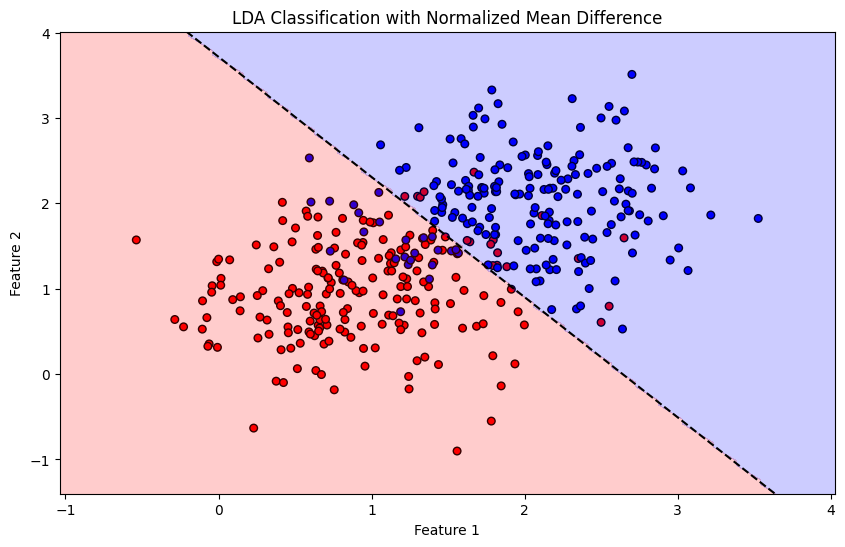

Classification Accuracy: 88.75%


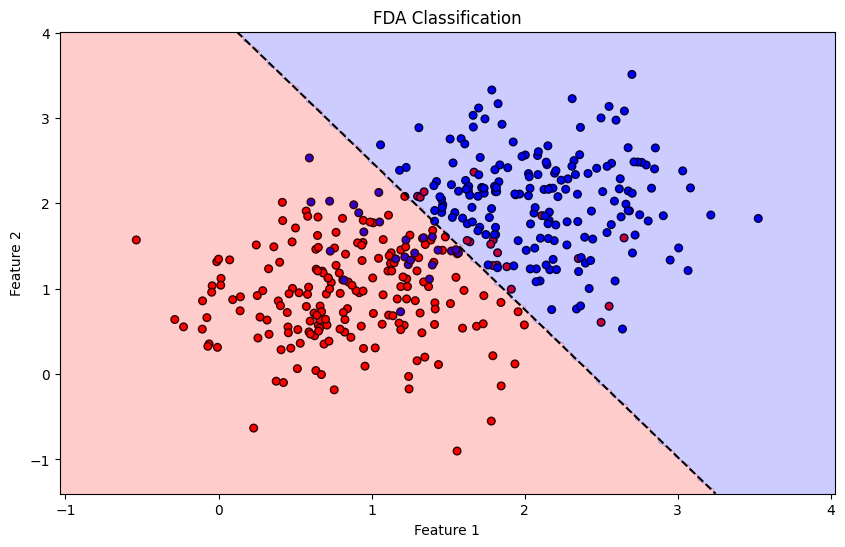

In [ ]:
########################################
#Part-2)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.concatenate((class1_tr, class2_tr), axis = 0)              #Combine class1 training and class2 training data to get total training data
tr_targets = np.array([0]*50 + [1]*50)           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class2_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.concatenate((class1_te, class2_te), axis=0)              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.array([0]*200 + [1]*200)           #Class labels. Assign the value "0" to class1 and the value "1" to class2.


########################################
#Part-2)-(b)
########################################
#Complete the below function
def LDA_classify(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Between class covariance

  #Compute the weight vector
  class1_ind = np.where(Y_train == 0)[0]
  class2_ind = np.where(Y_train == 1)[0]
  class1_mean = np.mean(X_train[class1_ind], axis=0)
  class2_mean = np.mean(X_train[class2_ind], axis=0)

  w = class2_mean - class1_mean
  w /= np.linalg.norm(w)  # Normalize the weight vector

  #Compute the threshold
  proj_m1 = class1_mean @ w
  proj_m2 = class2_mean @ w
  threshold = (proj_m1 + proj_m2) / 2

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
  projections = X_test @ w
  predictions = (projections > threshold).astype(int)

  #Return weight vector and the predictions on testing data

  return predictions, w, threshold


def LDA_project(w, threshold, X_test, Y_test):
  # Calculate predictions and accuracy
  projections = X_test @ w
  predictions = (projections > threshold).astype(int)
  accuracy = np.mean(predictions == Y_test)

  print(f"Classification Accuracy: {accuracy*100:.2f}%")

  # Create decision boundary visualization
  plt.figure(figsize=(10, 6))

  # Plot data points
  plt.scatter(X_test[:, 0], X_test[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), edgecolor='k', s=30)

  # Plot decision boundary (w⋅x = threshold)
  x_min, x_max = X_test[:, 0].min()-0.5, X_test[:, 0].max()+0.5
  y_min, y_max = X_test[:, 1].min()-0.5, X_test[:, 1].max()+0.5
  xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
  z = (np.c_[xx.ravel(), yy.ravel()] @ w - threshold).reshape(xx.shape)

  plt.contour(xx, yy, z, levels=[0], colors='black', linestyles='dashed')
  plt.contourf(xx, yy, z > 0, alpha=0.2, cmap=ListedColormap(('red', 'blue')))

  plt.title("LDA Classification with Normalized Mean Difference")
  plt.xlabel("Feature 1")
  plt.ylabel("Feature 2")
  plt.show()

predictions, w, threshold = LDA_classify(tr_data, tr_targets, te_data)
LDA_project(w, threshold, te_data, te_targets)
#Compute and print the accuracy



########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Weight vector and predictions

  #Compute the weight vector
  mean1 = np.mean(X_train[Y_train == 0], axis=0)  # Mean of class 1
  mean2 = np.mean(X_train[Y_train == 1], axis=0)  # Mean of class 2

  sw1 = np.cov(X_train[Y_train == 0], rowvar=False)  # Covariance of class 1
  sw2 = np.cov(X_train[Y_train == 1], rowvar=False)  # Covariance of class 2
  n1 = len(X_train[Y_train == 0])
  n2 = len(X_train[Y_train == 1])

  sw = (n1-1)*sw1 + (n2-1)*sw2

  w = np.linalg.inv(sw) @ (mean2 - mean1)  # Weight vector
  w /= np.linalg.norm(w)  # Normalize the weight vector

  #Compute the threshold
  proj_m1 = mean1 @ w  # Projection of class 1 mean
  proj_m2 = mean2 @ w  # Projection of class 2 mean
  threshold = (proj_m1 + proj_m2) / 2  # Threshold for classification

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
  projections = X_test @ w  # Project test data
  predictions = (projections > threshold).astype(int)  # Classify based on threshold

  #Return weight vector and the predictions on testing data

  return w, predictions, threshold

w, predictions, threshold = FDA_classify(tr_data, tr_targets, te_data)


def FDA_project(w, X_test, Y_test, threshold):
  #Inputs: weight vector, testing data, and testing labels

  #Project the test data onto 1-dimensional space
  projection = X_test @ w
  predictions = (projection > threshold).astype(int)
  accuracy = np.mean(predictions == Y_test)

  print(f"Classification Accuracy: {accuracy*100:.2f}%")

  plt.figure(figsize=(10, 6))

  # Plot data points
  plt.scatter(X_test[:, 0], X_test[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), edgecolor='k', s=30)

  # Plot decision boundary (w⋅x = threshold)
  x_min, x_max = X_test[:, 0].min()-0.5, X_test[:, 0].max()+0.5
  y_min, y_max = X_test[:, 1].min()-0.5, X_test[:, 1].max()+0.5
  xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
  z = (np.c_[xx.ravel(), yy.ravel()] @ w - threshold).reshape(xx.shape)

  plt.contour(xx, yy, z, levels=[0], colors='black', linestyles='dashed')
  plt.contourf(xx, yy, z > 0, alpha=0.2, cmap=ListedColormap(('red', 'blue')))

  plt.title("FDA Classification")
  plt.xlabel("Feature 1")
  plt.ylabel("Feature 2")
  plt.show()


FDA_project(w, te_data, te_targets, threshold)

########################################
#Part-2)-(d)
########################################
def FDA_project_K(X_train, Y_train, X_test, k):
  #Inputs: Training data, Training label, Testing data, and the number of eigen vectors to be considered
  #Oupur: Projection matrix

  means = [np.mean(X_train[Y_train == k], axis=0) for k in np.unique(Y_train)]  # Mean of each class
  class_cov = [np.cov(X_train[Y_train == k], rowvar=False) for k in np.unique(Y_train)]

  overall_mean = np.mean(X_train, axis=0)  # Overall mean of the data

  sw = np.zeros((X_train.shape[1], X_train.shape[1]))  # Within-class scatter matrix
  for i, cov in enumerate(class_cov):
    n_c = len(X_train[Y_train == i])
    sw += (n_c - 1) * cov  # Within-class scatter

  sb = np.zeros((X_train.shape[1], X_train.shape[1]))  # Between-class scatter matrix
  for i, mean in enumerate(means):
    X_c = X_train[Y_train == i]
    n_c = X_c.shape[0]

    # Between-class scatter
    mu_diff = (mean - overall_mean).reshape(-1, 1)
    sb += n_c * (mu_diff @ mu_diff.T)

  # Regularization to handle singular SW
  sw += 1e-6 * np.eye(X_train.shape[1])

  # Solve generalized eigenvalue problem
  eigenvalues, eigenvectors = np.linalg.eig(np.linalg.inv(sw) @ sb)

  # Sort eigenvectors by descending eigenvalues (real valued part)
  sorted_idx = np.argsort(eigenvalues.real)[::-1]
  eigenvectors = eigenvectors[:, sorted_idx].real

  # Select top K eigenvectors (considering class count limit)
  max_k = min(k, len(means)-1, X_train.shape[1])
  w = eigenvectors[:, :max_k]

  #Compute and return the projection matrix
  return w





<b> Report your observations </b>

1. Both LDA and FDA successfully reduce the dimensionality while preserving class separability.

2. For this dataset with equal covariance matrices, LDA and FDA yield similar projection directions and classification results, as expected from theory.

3. The projection direction aligns approximately with the line connecting the class means, which is the theoretically optimal direction for maximizing class separation in this scenario


<b> Part (3) : Classification using perceptron algorithm </b>

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


Perceptron Accuracy:  0.645
Perceptron Weights:  [-0.7         0.41334381  0.39147673]


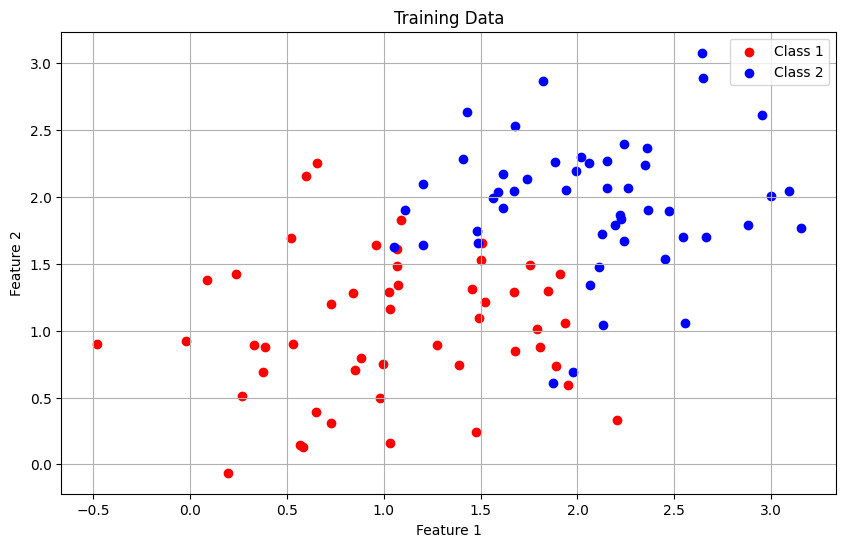

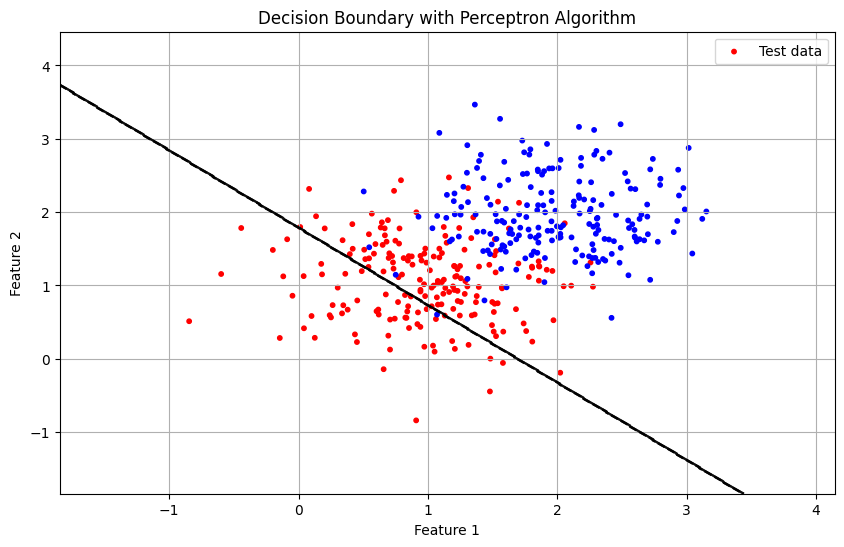

Least Squares Accuracy:  0.905
Least Squares Weights:  [-1.90503396  0.58963135  0.66416518]


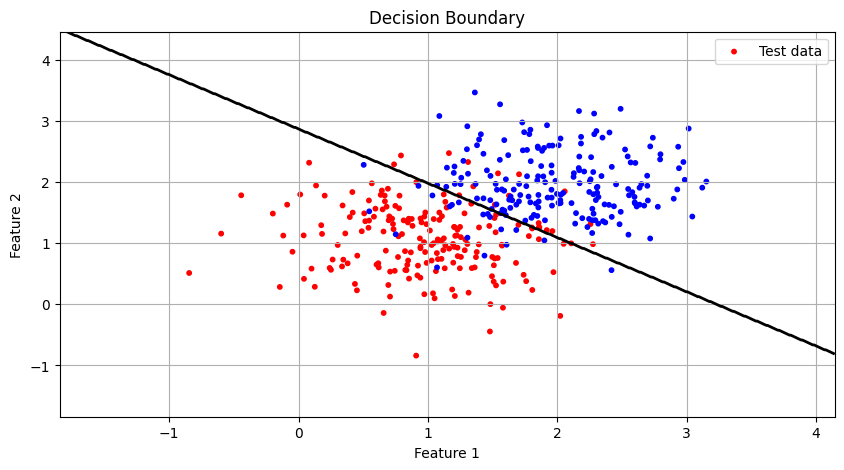

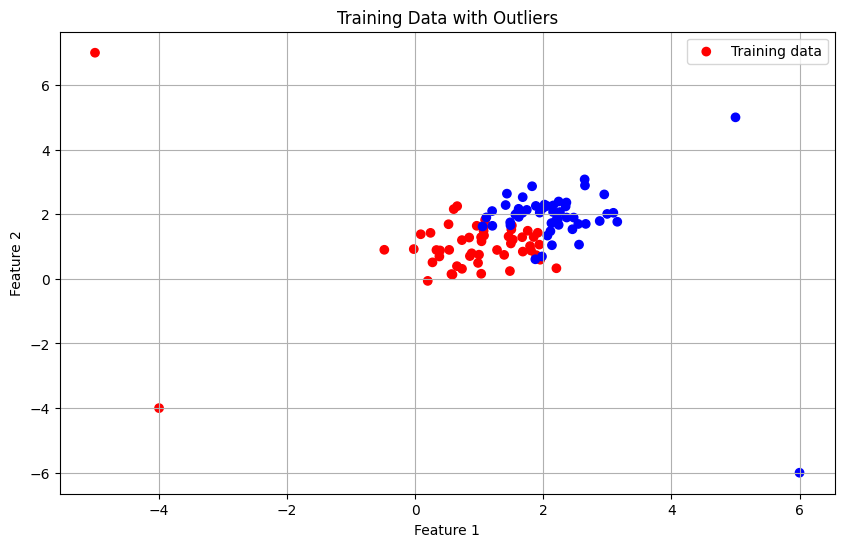

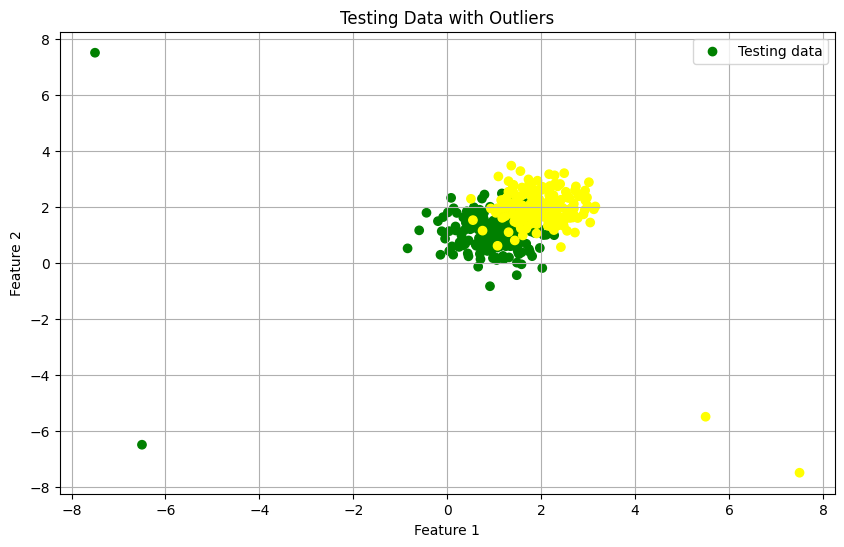

Perceptron Accuracy:  0.7846534653465347
Perceptron Weights:  [-2.3         1.82321903  0.26835468]


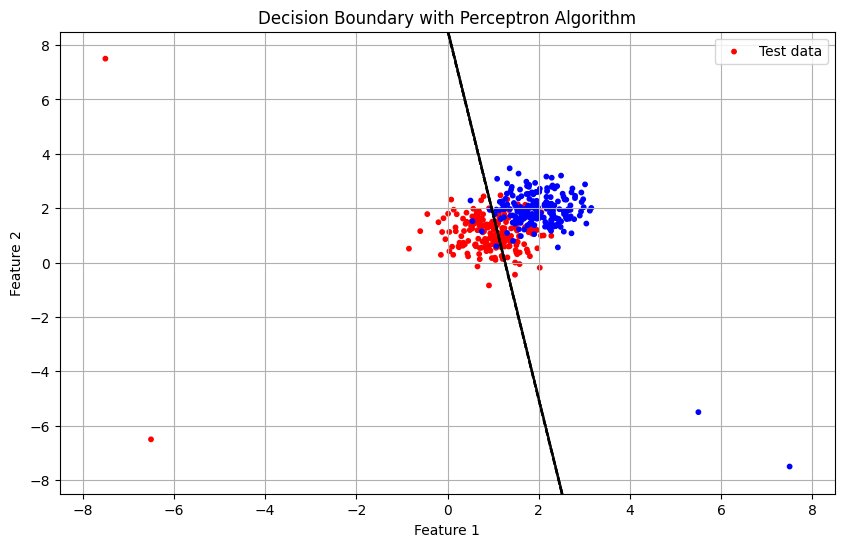

Least Squares Accuracy:  0.8960396039603961
Least Squares Weights:  [-1.02234412  0.43967785  0.24576001]


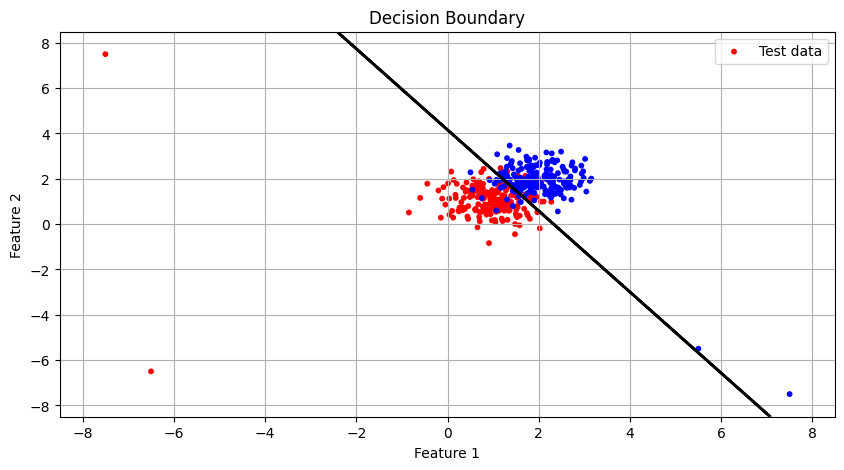

Perceptron Accuracy:  0.5
Perceptron Weights:  [-0.3        -0.157144   -0.14356617]


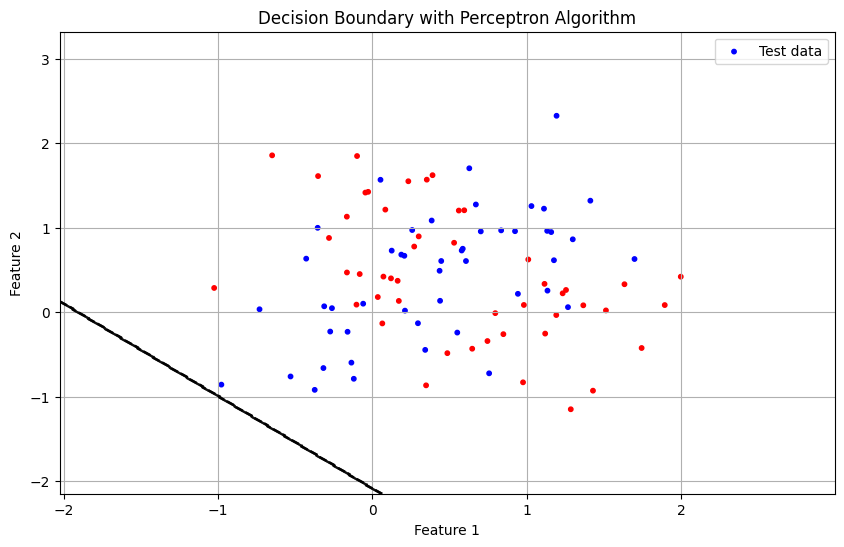

In [ ]:
########################################
#Part-3)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.concatenate((class1_tr, class2_tr), axis = 0)              #Combine class1 training and class2 training data to get total training data
tr_targets = np.array([-1]*50 + [1]*50)           #Class labels. Assign the value "-1" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.concatenate((class1_te, class2_te), axis=0)              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.array([-1]*200 + [1]*200)         #Class labels. Assign the value "-1" to class1 and the value "1" to class2.



########################################
#Part-3)-(b)
########################################
def Perceptron(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, Testing data
    #Outputs: Testing data predictions, Weight vector representing the decision boundary

    epochs = 10000    #Number of epochs
    X = np.c_[np.ones(X_train.shape[0]), X_train]  #Add bias term to training data
    w = np.zeros(X.shape[1])  #Initialize weight vector

    for _ in range(0,epochs,1):
        for i in range(X.shape[0]):
            act = X[i] @ w
            pred = 1 if act >= 0 else -1

            if pred != Y_train[i]:
                w += 0.1 * X[i] * Y_train[i]

    #Compute the test data predicitions using the final weight vector
    x_test_aug = np.c_[np.ones(X_test.shape[0]), X_test]
    predictions = np.sign(x_test_aug @ w)

    #Return the test data predictions and the final weight vector
    return predictions, w


##########################################
#Plot the decision boundary using perceptron
##########################################
predictions, w = Perceptron(tr_data, tr_targets, te_data)  # Let Perceptron handle bias
accuracy = np.mean(predictions == te_targets)  # Compute accuracy
print("Perceptron Accuracy: ", accuracy)
print("Perceptron Weights: ", w)

plt.figure(figsize=(10, 6))
plt.scatter(class1_tr[:, 0], class1_tr[:, 1], c='r', label='Class 1')
plt.scatter(class2_tr[:, 0], class2_tr[:, 1], c='b', label='Class 2')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.title('Training Data')
plt.show()

xx, yy = np.meshgrid(np.arange(te_data[:, 0].min()-1, te_data[:, 0].max()+1, 0.01), np.arange(te_data[:, 1].min()-1, te_data[:, 1].max()+1, 0.01))
z = np.c_[xx.ravel(), yy.ravel()]
z_aug = np.c_[np.ones(z.shape[0]), z]  # Add bias term to test data
predictions = np.sign(z_aug @ w)  # Get predictions for the grid points
predictions = predictions.reshape(xx.shape)

plt.figure(figsize=(10, 6))
plt.contour(xx, yy, predictions, alpha=0.5, colors='black')  # Decision boundary
plt.scatter(te_data[:, 0], te_data[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')

plt.title('Decision Boundary with Perceptron Algorithm')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()


##########################################
#Plot the decision boundary using least squares
##########################################
X_train_aug = np.c_[np.ones(tr_data.shape[0]), tr_data]  # Add bias term to training data
X_test_aug = np.c_[np.ones(te_data.shape[0]), te_data]  # Add bias term to testing data
pred_ls, w = LS_Classify(X_train_aug, tr_targets, X_test_aug)  # Get predictions using least squares
accuracy = LS_Classify_Accuracy(te_targets, pred_ls)  # Compute accuracy
print("Least Squares Accuracy: ", accuracy)
print("Least Squares Weights: ", w)  # Print weights

x_min, x_max = te_data[:, 0].min() - 1, te_data[:, 0].max() + 1
y_min, y_max = te_data[:, 1].min() - 1, te_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z = np.c_[xx.ravel(), yy.ravel()]
Z_aug = np.c_[np.ones(Z.shape[0]), Z]
predictions = np.sign(Z_aug @ w)  # Get predictions for the grid points
predictions = predictions.reshape(xx.shape)

plt.figure(figsize=(10, 5))
plt.contour(xx, yy, predictions, levels=[0], colors='black', linewidths=2)
plt.scatter(te_data[:, 0], te_data[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
plt.title('Decision Boundary')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()




##########################################
#Part-3)-(c): Repeat the experiments with the true outliers added to the data. Compare and contrast the perceptron algorithm with least squares method
##########################################

outliers_train = np.array([[5, 5], [-4, -4], [6, -6], [-5, 7]])
outliers_train_labels = np.array([1, -1, 1, -1])

outliers_test = np.array([[5.5, -5.5], [-6.5, -6.5], [7.5, -7.5], [-7.5, 7.5]])
outliers_test_labels = np.array([1, -1, 1, -1])

# Update training and testing datasets with outliers
tr_data_with_outliers = np.vstack((tr_data, outliers_train))
tr_targets_with_outliers = np.hstack((tr_targets, outliers_train_labels))

te_data_with_outliers = np.vstack((te_data, outliers_test))
te_targets_with_outliers = np.hstack((te_targets, outliers_test_labels))

# Visualize the dataset with outliers
plt.figure(figsize=(10, 6))
plt.scatter(tr_data_with_outliers[:, 0], tr_data_with_outliers[:, 1], c=tr_targets_with_outliers, cmap=ListedColormap(('red', 'blue')), label='Training data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Training Data with Outliers')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(te_data_with_outliers[:, 0], te_data_with_outliers[:, 1], c=te_targets_with_outliers, cmap=ListedColormap(('green', 'yellow')), label='Testing data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Testing Data with Outliers')
plt.legend()
plt.grid()
plt.show()


# Perceptron with outliers
predictions, w = Perceptron(tr_data_with_outliers, tr_targets_with_outliers, te_data_with_outliers)
accuracy = np.mean(predictions == te_targets_with_outliers)  # Compute accuracy
print("Perceptron Accuracy: ", accuracy)
print("Perceptron Weights: ", w)

xx, yy = np.meshgrid(np.arange(te_data_with_outliers[:, 0].min()-1, te_data_with_outliers[:, 0].max()+1, 0.01),
                     np.arange(te_data_with_outliers[:, 1].min()-1, te_data_with_outliers[:, 1].max()+1, 0.01))
z = np.c_[xx.ravel(), yy.ravel()]
z_aug = np.c_[np.ones(z.shape[0]), z]  # Add bias term to test data
predictions = np.sign(z_aug @ w)  # Get predictions for the grid points
predictions = predictions.reshape(xx.shape)

plt.figure(figsize=(10, 6))
plt.contour(xx, yy, predictions, alpha=0.5, colors='black')  # Decision boundary
plt.scatter(te_data_with_outliers[:, 0], te_data_with_outliers[:, 1], c=te_targets_with_outliers,
            cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')

plt.title('Decision Boundary with Perceptron Algorithm')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()

# Least Squares with outliers
X_train_aug = np.c_[np.ones(tr_data_with_outliers.shape[0]), tr_data_with_outliers]
X_test_aug = np.c_[np.ones(te_data_with_outliers.shape[0]), te_data_with_outliers]
pred_ls, w = LS_Classify(X_train_aug, tr_targets_with_outliers, X_test_aug)
accuracy = LS_Classify_Accuracy(te_targets_with_outliers, pred_ls)  # Compute accuracy
print("Least Squares Accuracy: ", accuracy)
print("Least Squares Weights: ", w)  # Print weights

x_min, x_max = te_data_with_outliers[:, 0].min() - 1, te_data_with_outliers[:, 0].max() + 1
y_min, y_max = te_data_with_outliers[:, 1].min() - 1, te_data_with_outliers[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z = np.c_[xx.ravel(), yy.ravel()]
Z_aug = np.c_[np.ones(Z.shape[0]), Z]
predictions = np.sign(Z_aug @ w)  # Get predictions for the grid points
predictions = predictions.reshape(xx.shape)

plt.figure(figsize=(10, 5))
plt.contour(xx, yy, predictions, levels=[0], colors='black', linewidths=2)
plt.scatter(te_data_with_outliers[:, 0], te_data_with_outliers[:, 1], c=te_targets_with_outliers, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
plt.title('Decision Boundary')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()




##########################################
#Part-3)-(d): Data generation XOR
##########################################

#Set the parameters of Gaussian distribution
class1_mean1 = [0, 0]           #Mean of class1
class1_mean2 = [1, 1]           #Mean of class2
class2_mean1 = [1, 0]           #Mean of class3
class2_mean2 = [0, 1]           #Mean of class4
class1_cov = [[0.3, 0],[0, 0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate  data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution

class1_data1 = np.random.multivariate_normal(class1_mean1, class1_cov, 60)
class1_data2 = np.random.multivariate_normal(class1_mean2, class1_cov, 60)
class2_data1 = np.random.multivariate_normal(class2_mean1, class1_cov, 60)
class2_data2 = np.random.multivariate_normal(class2_mean2, class1_cov, 60)

#Obtain 2-class dataset
class1_t = np.array([1] * 120)
class2_t = np.array([-1] * 120)

#Create train test splits
class1_tr = np.concatenate((class1_data1[:36], class1_data2[:36]), axis=0)            #Class1 training data
class2_tr = np.concatenate((class2_data1[:36], class2_data2[:36]), axis=0)            #Class2 training data

class1_te = np.concatenate((class1_data1[36:], class1_data2[36:]), axis=0)            #Class1 testing data
class2_te = np.concatenate((class2_data1[36:], class2_data2[36:]), axis=0)            #Class2 testing data

train_data = np.concatenate((class1_tr, class2_tr), axis=0)
test_data = np.concatenate((class1_te, class2_te), axis=0)

train_targets = np.concatenate((class1_t[:72], class2_t[:72]), axis=0)
test_targets = np.concatenate((class1_t[72:], class2_t[72:]), axis=0)

#Classify this dataset using perceptron algorithm

predictions, w = Perceptron(train_data, train_targets, test_data)  # Let Perceptron handle bias
accuracy = np.mean(predictions == test_targets)  # Compute accuracy
print("Perceptron Accuracy: ", accuracy)
print("Perceptron Weights: ", w)

#Plot the decision boundary
xx, yy = np.meshgrid(np.arange(test_data[:, 0].min()-1, test_data[:, 0].max()+1, 0.01),
                     np.arange(test_data[:, 1].min()-1, test_data[:, 1].max()+1, 0.01))
z = np.c_[xx.ravel(), yy.ravel()]
z_aug = np.c_[np.ones(z.shape[0]), z]  # Add bias term to test data
predictions = np.sign(z_aug @ w)  # Get predictions for the grid points
predictions = predictions.reshape(xx.shape)

plt.figure(figsize=(10, 6))
plt.contour(xx, yy, predictions, alpha=0.5, colors='black')  # Decision boundary
plt.scatter(test_data[:, 0], test_data[:, 1], c=test_targets, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
plt.title('Decision Boundary with Perceptron Algorithm')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()






<b> Report your observations </b>

1. Despite some overlap in the distributions (due to shared covariance matrix), the Perceptron classifier achieves good separation.

2. The least squares solution is almost similar to the perceptron solution.

3. The linear decision boundary passes approximately midway between the two class means, as expected for balanced classes with equal covariances.

4. Perceptron performance degrades with outliers as they cause significant weight updates during training.

5. Least Squares classification appears to be less affected by outliers than Perceptron.

6. A single linear boundary cannot separate the XOR pattern, resulting in poor classification performance. The visualization shows a linear decision boundary attempting to minimize errors, but it cannot achieve proper separation.



<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b> Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**b). Class distributions have different covariance matrices: Non-linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**c). Report your observations**




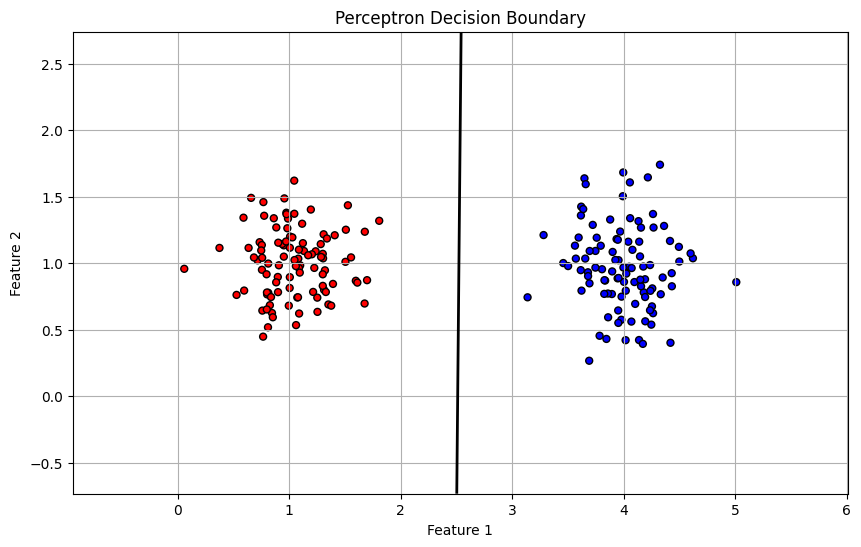

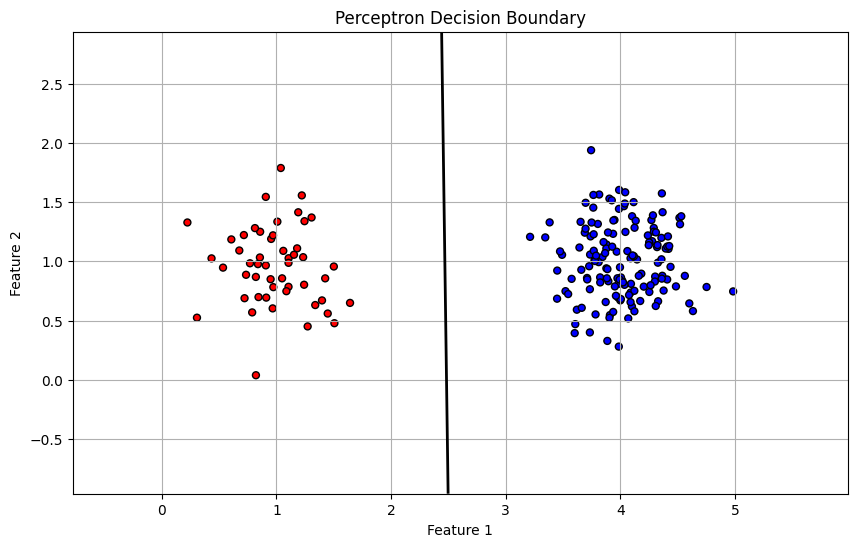

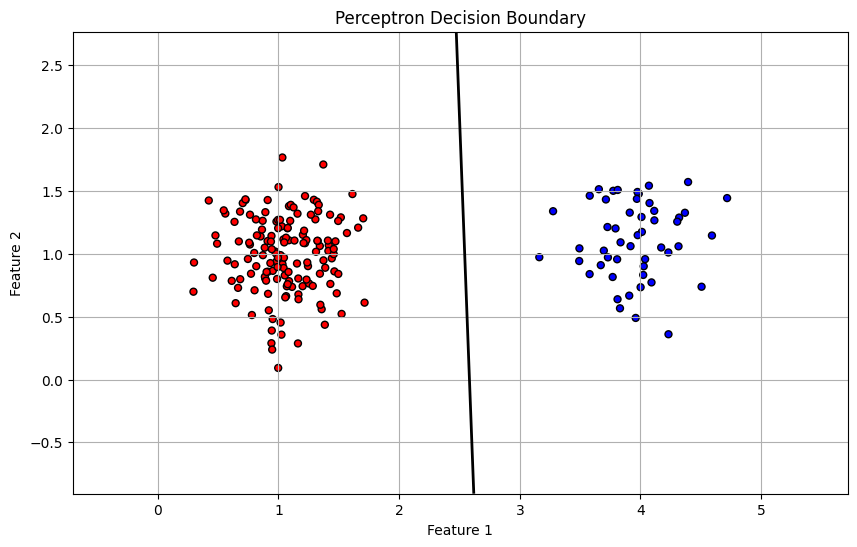

Decision Boundary Parameters for Case 1:  [ 74.03857146 -29.49044362   0.33111284]
Decision Boundary Parameters for Case 2:  [ 75.04233342 -30.21408301  -0.43843635]
Decision Boundary Parameters for Case 3:  [ 74.77071583 -28.95228282  -1.14479449]


In [ ]:
##########################################
#Part-4a)-0: Data Generation
##########################################
m1 = [1,1]
m2 = [4,1]
cov = [[0.1, 0], [0, 0.1]]

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

sample_c1_1 = np.random.multivariate_normal(m1, cov, 100)            #Class1 training data
sample_c2_1 = np.random.multivariate_normal(m2, cov, 100)            #Class2 training data
data_1 = np.concatenate((sample_c1_1, sample_c2_1), axis=0)
data_1_aug = np.c_[np.ones(data_1.shape[0]), data_1]  # Add bias term to training data
target_1 = np.array([0]*100 + [1]*100)

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

sample_c1_2 = np.random.multivariate_normal(m1, cov, 50)            #Class1 training data
sample_c2_2 = np.random.multivariate_normal(m2, cov, 150)            #Class2 training data
data_2 = np.concatenate((sample_c1_2, sample_c2_2), axis=0)
data_2_aug = np.c_[np.ones(data_2.shape[0]), data_2]  # Add bias term to training data
target_2 = np.array([0]*50 + [1]*150)

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution

sample_c1_3 = np.random.multivariate_normal(m1, cov, 150)            #Class1 training data
sample_c2_3 = np.random.multivariate_normal(m2, cov, 50)            #Class2 training data
data_3 = np.concatenate((sample_c1_3, sample_c2_3), axis=0)
data_3_aug = np.c_[np.ones(data_3.shape[0]), data_3]  # Add bias term to training data
target_3 = np.array([0]*150 + [1]*50)


##########################################
#Part-4a)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train, cov):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w

    p_c1 = np.mean(Y_train == 0)
    p_c2 = 1 - p_c1

    mean_1 = np.mean(X_train[Y_train == 0], axis=0)  # Mean of class 1
    mean_2 = np.mean(X_train[Y_train == 1], axis=0)  # Mean of class 2

    w = np.linalg.inv(cov) @ (mean_1 - mean_2)  # Weight vector
    w0 = -0.5 * (mean_1.T @ np.linalg.inv(cov) @ mean_1) + 0.5 * (mean_2.T @ np.linalg.inv(cov) @ mean_2) + np.log(p_c1/p_c2)

    w_est = np.array([w0]+list(w))
    return w_est

#Plot the decision regions

def plot_decision_regions(X_train, Y_train, w):
    # Create grid
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                         np.linspace(y_min, y_max, 500))

    # Compute decision function (w0 + w1*x1 + w2*x2)
    Z = np.c_[np.ones(xx.ravel().shape[0]), xx.ravel(), yy.ravel()] @ w
    Z = Z.reshape(xx.shape)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.contour(xx, yy, Z, levels=[0], colors='black', linewidths=2)
    plt.scatter(X_train[:, 0], X_train[:, 1], c=Y_train,
                cmap=ListedColormap(('red', 'blue')), edgecolor='k', s=25)
    plt.title('Decision Boundary')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.grid()
    plt.show()


w_1 = decisionBoundary(data_1, target_1, cov)  # Get decision boundary parameters for case 1
plot_decision_regions(data_1, target_1, w_1)  # Plot decision regions for case 1

w_2 = decisionBoundary(data_2, target_2, cov)  # Get decision boundary parameters for case 2
plot_decision_regions(data_2, target_2, w_2)  # Plot decision regions for case 2

w_3 = decisionBoundary(data_3, target_3, cov)  # Get decision boundary parameters for case 3
plot_decision_regions(data_3, target_3, w_3)  # Plot decision regions for case 3

print("Decision Boundary Parameters for Case 1: ", w_1)
print("Decision Boundary Parameters for Case 2: ", w_2)
print("Decision Boundary Parameters for Case 3: ", w_3)



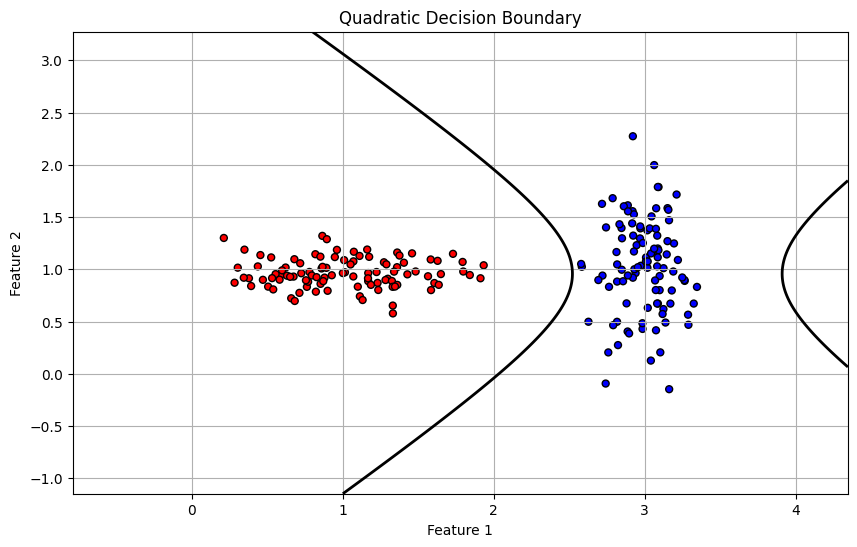

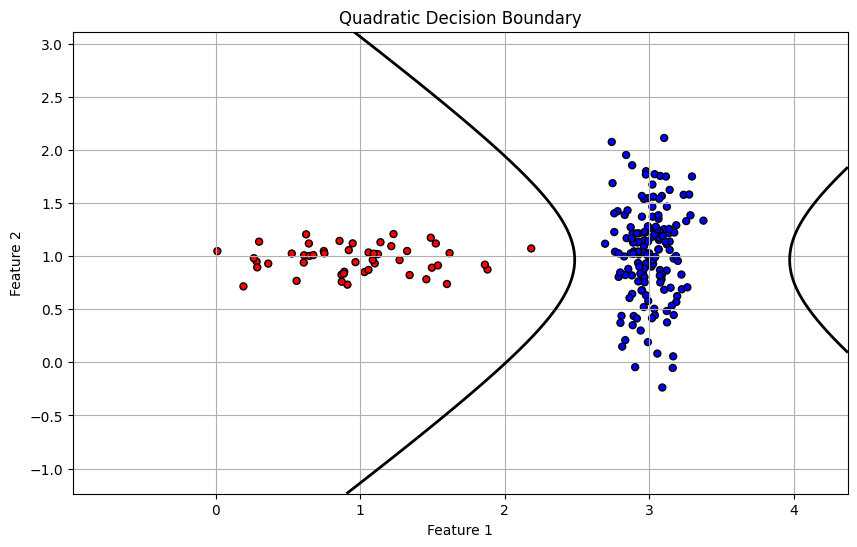

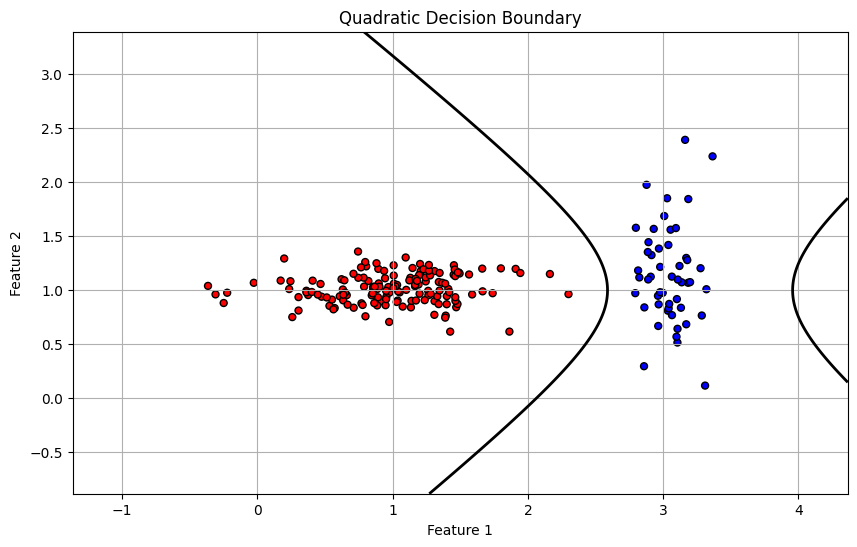

In [ ]:
##########################################
#Part-4b)-0: Data Generation
##########################################
m1 = [1,1]
m2 = [3,1]
cov1 = [[0.2, 0], [0, 0.02]]
cov2 = [[0.02, 0], [0, 0.2]]

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
sample_c1_1 = np.random.multivariate_normal(m1, cov1, 100)            #Class1 training data
sample_c2_1 = np.random.multivariate_normal(m2, cov2, 100)            #Class2 training data
data_1 = np.concatenate((sample_c1_1, sample_c2_1), axis=0)
data_1_aug = np.c_[np.ones(data_1.shape[0]), data_1]  # Add bias term to training data
target_1 = np.array([0]*100 + [1]*100)

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
sample_c1_2 = np.random.multivariate_normal(m1, cov1, 50)            #Class1 training data
sample_c2_2 = np.random.multivariate_normal(m2, cov2, 150)            #Class2 training data
data_2 = np.concatenate((sample_c1_2, sample_c2_2), axis=0)
data_2_aug = np.c_[np.ones(data_2.shape[0]), data_2]  # Add bias term to training data
target_2 = np.array([0]*50 + [1]*150)

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
sample_c1_3 = np.random.multivariate_normal(m1, cov1, 150)            #Class1 training data
sample_c2_3 = np.random.multivariate_normal(m2, cov2, 50)            #Class2 training data
data_3 = np.concatenate((sample_c1_3, sample_c2_3), axis=0)
data_3_aug = np.c_[np.ones(data_3.shape[0]), data_3]  # Add bias term to training data
target_3 = np.array([0]*150 + [1]*50)

##########################################
#Part-4b)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train, cov1, cov2):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.mean(Y_train == 0)
    p_c2 = 1. - p_c1

    mean_1 = np.mean(X_train[Y_train == 0], axis=0)  # Mean of class 1
    mean_2 = np.mean(X_train[Y_train == 1], axis=0)  # Mean of class 2

    #Compute predictions on test data
    A = 0.5 * (np.linalg.inv(cov2) - np.linalg.inv(cov1))
    b = np.linalg.inv(cov1) @ mean_1 - np.linalg.inv(cov2) @ mean_2
    c = 0.5 * (mean_2.T @ np.linalg.inv(cov2) @ mean_2 - mean_1.T @ np.linalg.inv(cov1) @ mean_1) + np.log(p_c1/p_c2)

    return A, b, c

#Plot the decision regions
def plot_decision_regions(X_train, Y_train, A, b, c):
    # Create grid for visualization
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                         np.linspace(y_min, y_max, 500))

    # Compute decision function values for the grid points
    Z = (
        A[0, 0] * xx**2 + (A[0, 1] + A[1, 0]) * xx * yy + A[1, 1] * yy**2 +
        b[0] * xx + b[1] * yy + c
    )
    Z = Z.reshape(xx.shape)

    # Plot decision boundary and data points
    plt.figure(figsize=(10, 6))
    plt.contour(xx, yy, Z, levels=[0], colors='black', linewidths=2)  # Decision boundary at Z=0
    plt.scatter(X_train[:, 0], X_train[:, 1], c=Y_train,
                cmap=ListedColormap(('red', 'blue')), edgecolor='k', s=25)
    plt.title('Quadratic Decision Boundary')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.grid()
    plt.show()


A1, b1, c1 = decisionBoundary(data_1, target_1, cov1, cov2)  # Get decision boundary parameters for case 1
plot_decision_regions(data_1, target_1, A1, b1, c1)  # Plot decision regions for case 1

A2, b2, c2 = decisionBoundary(data_2, target_2, cov1, cov2)  # Get decision boundary parameters for case 2
plot_decision_regions(data_2, target_2, A2, b2, c2)  # Plot decision regions for case 2

A3, b3, c3 = decisionBoundary(data_3, target_3, cov1, cov2)  # Get decision boundary parameters for case 3
plot_decision_regions(data_3, target_3, A3, b3, c3)  # Plot decision regions for case 3



<b> Report your observations </b>

1. The decision boundary for equal priors is approximately a line midway between the classes. As the priors of one class increase, the boundary tilts towards the class which has lesser prior.

2. For unequal priors, the boundary becomes curved (quadratic), potentially forming ellipses, hyperbolas, or parabolas

3. The curvature captures the differences in spread and orientation of each class distribution



<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression: 0.905 




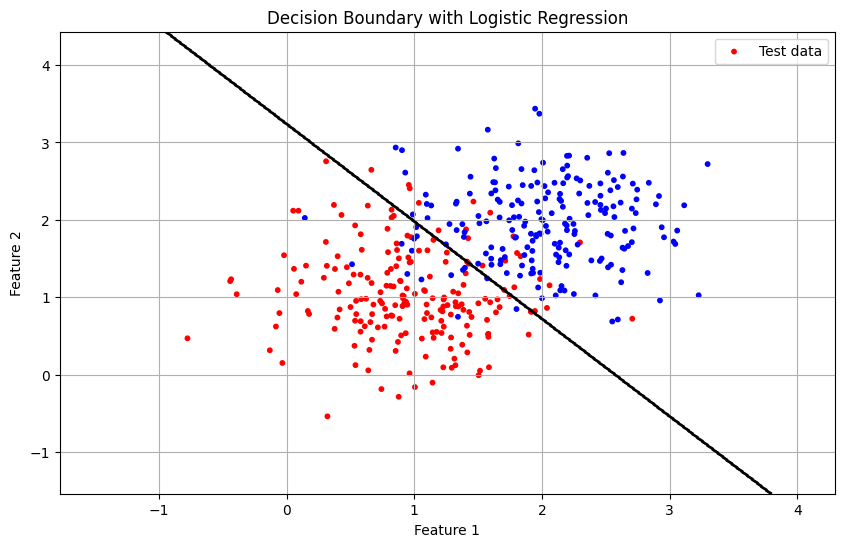

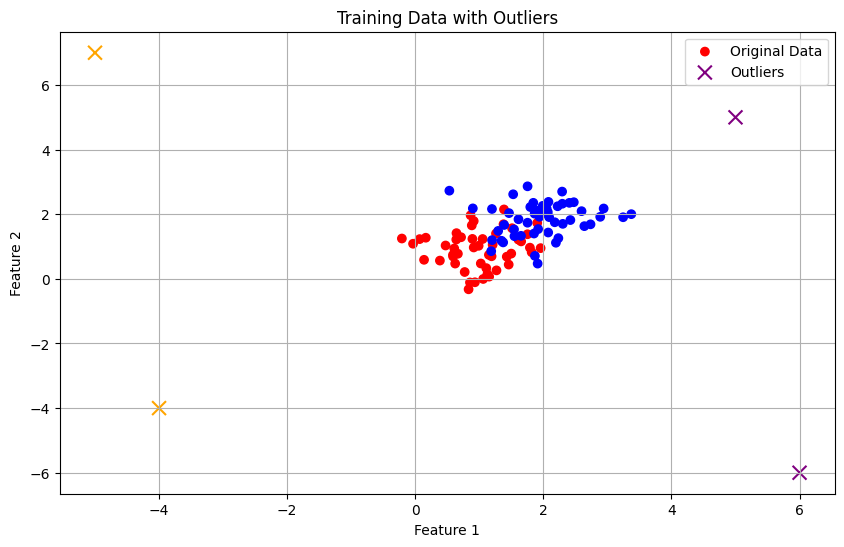


 Accuracy with Logistic Regression and Outliers: 0.9034653465346535
Logistic Regression Weights with Outliers:  [-7.86393838  3.5113648   1.96928907]


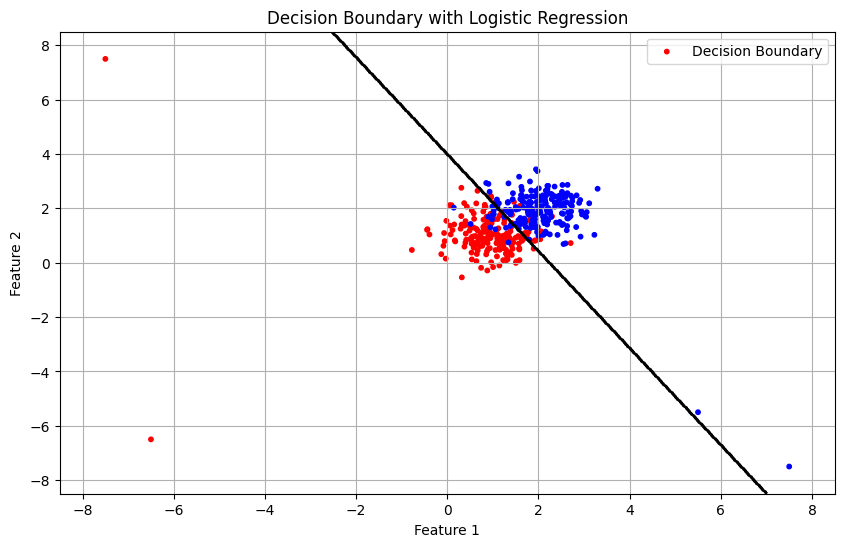

Least Squares Accuracy with Outliers:  0.8985148514851485
Least Squares Weights with Outliers:  [0.02160379 0.21849911 0.12073544]


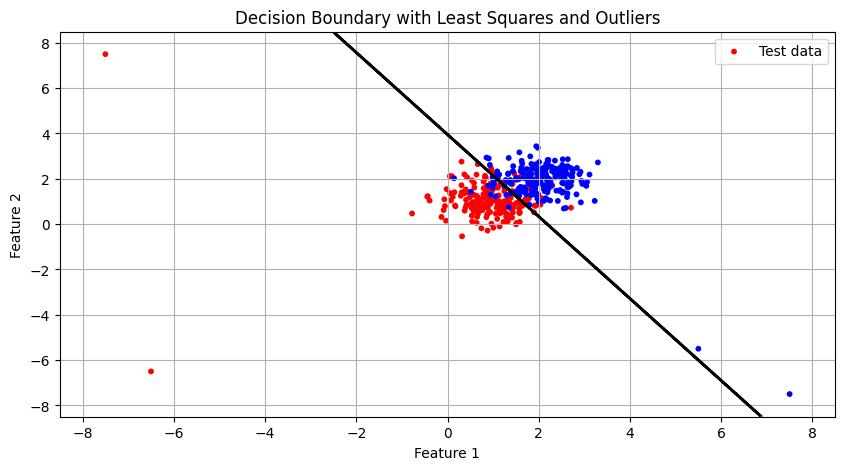

In [ ]:
##################################################
#Part-5)-1: Data generation
##################################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix.

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)           #Class2 training data
tr_data = np.concatenate((class1_tr, class2_tr), axis=0)              #Combine class1 training and class2 training data to get total training data
tr_targets = np.array([0]*50 + [1]*50)           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)           #Class2 testing data
te_data = np.concatenate((class1_te, class2_te), axis=0)              #Combine class1 training and class2 training data to get total training data
te_targets = np.array([0]*200 + [1]*200)  #Class labels. Assign the value "0" to class1 and the value "1" to class2.


##################################################
#Part-5)-b: Complete the below logistic regression function
##################################################
def Logistic_Regression(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Predictions on test data

  max_iter = 1000                 #max number of ierations for parameter update
  threshold = 0.5                   #threshold for classification
  X = np.c_[np.ones(X_train.shape[0]), X_train]         #Data. Append ones to the training data to take care of the bias
  w = np.zeros(X.shape[1])         #Initialize the weight vector

  for iter in range(0,max_iter,1):
    preds = 1.0 / (1.0 + np.exp(- X @ w))   #Predictions on X. Sigmoid(w^T.x)
    error = preds - Y_train   #Difference between preds and Y_train

    #Compute the gradients and the appropriate learning rate. We can use Hessian matrix as learning rate
    grad = X.T @ error
    H = X.T @ np.diag(preds * (1 - preds)) @ X  #Hessian matrix

    #Update the weight vector
    w -= np.linalg.inv(H) @ grad

  #Test data predictions
  X_test = np.c_[np.ones(X_test.shape[0]), X_test]  #Append ones to the testing data to take care of the bias
  test_preds = X_test @ w   #Predictions on test data
  test_preds = 1.0 / (1.0 + np.exp(- test_preds))   #Sigmoid(w^T.x)
  test_preds = np.where(test_preds > threshold, 1, 0)   #Compare the predictions with 0, to output the decision

  #Return the predicted test labels
  return test_preds, w


Y_pred, w = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
  #Inputs: Ground truth and predicted lables of test data
  #Outputs: Accuracy

  acc = np.sum(Y_test == Y_pred) / len(Y_test)  #Compute the accuracy

  #Compute and return the accuracy
  return acc


acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')


##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################

def plot_decision_boundary(X_train, Y_train, w):
  xx, yy = np.meshgrid(np.arange(te_data[:, 0].min()-1, te_data[:, 0].max()+1, 0.01),
                    np.arange(te_data[:, 1].min()-1, te_data[:, 1].max()+1, 0.01))
  z = np.c_[xx.ravel(), yy.ravel()]
  z_aug = np.c_[np.ones(z.shape[0]), z]  # Add bias term to test data
  predictions = z_aug @ w  # Get predictions for the grid points
  predictions = 1.0 / (1.0 + np.exp(- predictions))  # Sigmoid(w^T.x)
  predictions = np.where(predictions > 0.5, 1, 0)  # Compare the predictions with 0, to output the decision

  predictions = predictions.reshape(xx.shape)
  plt.figure(figsize=(10, 6))
  plt.contour(xx, yy, predictions, alpha=0.5, colors='black')  # Decision boundary
  plt.scatter(te_data[:, 0], te_data[:, 1], c=te_targets, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
  plt.title('Decision Boundary with Logistic Regression')
  plt.xlabel('Feature 1')
  plt.ylabel('Feature 2')
  plt.legend()
  plt.grid()
  plt.show()

plot_decision_boundary(te_data, te_targets, w)

##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################

# Adding true outliers
outliers_train = np.array([[5, 5], [-4, -4], [6, -6], [-5, 7]])  # Training outliers
outliers_train_labels = np.array([1, 0, 1, 0])                  # Labels for training outliers

outliers_test = np.array([[5.5, -5.5], [-6.5, -6.5], [7.5, -7.5], [-7.5, 7.5]])  # Testing outliers
outliers_test_labels = np.array([1, 0, 1, 0])                                    # Labels for testing outliers

# Update training and testing datasets with outliers
tr_data_with_outliers = np.vstack((tr_data, outliers_train))
tr_targets_with_outliers = np.hstack((tr_targets, outliers_train_labels))

te_data_with_outliers = np.vstack((te_data, outliers_test))
te_targets_with_outliers = np.hstack((te_targets, outliers_test_labels))

# Visualize the dataset with outliers
plt.figure(figsize=(10, 6))
plt.scatter(tr_data[:, 0], tr_data[:, 1], c=tr_targets, cmap=ListedColormap(('red', 'blue')), label='Original Data')
plt.scatter(outliers_train[:, 0], outliers_train[:, 1], c=outliers_train_labels,
            cmap=ListedColormap(('orange', 'purple')), marker='x', s=100, label='Outliers')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Training Data with Outliers')
plt.legend()
plt.grid()
plt.show()


# Visualize the dataset with outliers for logistic regression

Y_pred_lr, weights_lr = Logistic_Regression(tr_data_with_outliers, tr_targets_with_outliers, te_data_with_outliers)
xx, yy = np.meshgrid(np.linspace(te_data_with_outliers[:, 0].min()-1, te_data_with_outliers[:, 0].max()+1, 500),
                     np.linspace(te_data_with_outliers[:, 1].min()-1, te_data_with_outliers[:, 1].max()+1, 500))
Z = np.c_[xx.ravel(), yy.ravel()]
Z_aug = np.c_[np.ones(Z.shape[0]), Z]
Z_pred_lr_probs = Z_aug @ weights_lr
Z_pred_lr_probs = 1.0 / (1.0 + np.exp(-Z_pred_lr_probs))
Z_pred_lr_binary = (Z_pred_lr_probs > 0.5).astype(int).reshape(xx.shape)

acc = LR_Accuracy(te_targets_with_outliers, Y_pred_lr)  # Compute accuracy
print('\n Accuracy with Logistic Regression and Outliers:', acc)
print("Logistic Regression Weights with Outliers: ", weights_lr)  # Print weights

plt.figure(figsize=(10, 6))
plt.contour(xx, yy, Z_pred_lr_binary, levels=[0.5], colors='black', linewidths=2)
plt.scatter(te_data_with_outliers[:, 0], te_data_with_outliers[:, 1], c=te_targets_with_outliers,
            cmap=ListedColormap(('red', 'blue')), s=10)
plt.title('Decision Boundary with Logistic Regression')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend(['Decision Boundary'])
plt.grid()
plt.show()

# visualize the dataset with outliers for least squares
X_train_aug = np.c_[np.ones(tr_data_with_outliers.shape[0]), tr_data_with_outliers]  # Add bias term to training data
X_test_aug = np.c_[np.ones(te_data_with_outliers.shape[0]), te_data_with_outliers]  # Add bias term to testing data
pred_ls, w = LS_Classify(X_train_aug, tr_targets_with_outliers, X_test_aug)  # Get predictions using least squares
accuracy = LS_Classify_Accuracy(te_targets_with_outliers, pred_ls)  # Compute accuracy
print("Least Squares Accuracy with Outliers: ", accuracy)
print("Least Squares Weights with Outliers: ", w)  # Print weights

x_min, x_max = te_data_with_outliers[:, 0].min() - 1, te_data_with_outliers[:, 0].max() + 1
y_min, y_max = te_data_with_outliers[:, 1].min() - 1, te_data_with_outliers[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z = np.c_[xx.ravel(), yy.ravel()]
Z_aug = np.c_[np.ones(Z.shape[0]), Z]
predictions = (Z_aug @ w > 0.5).astype(int)
predictions = predictions.reshape(xx.shape)

plt.figure(figsize=(10, 5))
plt.contour(xx, yy, predictions, levels=[0], colors='black', linewidths=2)
plt.scatter(te_data_with_outliers[:, 0], te_data_with_outliers[:, 1], c=te_targets_with_outliers, cmap=ListedColormap(('red', 'blue')), s=10, label='Test data')
plt.title('Decision Boundary with Least Squares and Outliers')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid()
plt.show()




Observations

1. The Logistic regression model classifies the data with very high accuracy (90%)

2. Upon introducing very true outliers in the input data, the performance of the Logistic regression model did not degrade at all, indicating some kind of resistance against the presence of very true points.

3. The least squares classification model also performed well against the data containing outliers but fell short of the Logistic regression performance, indicating that the Least squares solution is indeed affected by outliers.

<b> Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm </b>


 <b> a. Generating synthetic data : </b>  This part describes the steps involved in generating the synthetic data.


  1. Let us consider the GMM with Bivariate Gaussians   
  - Choose the appropriate means ($\mu$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this asignment.
<br>
  $ \pi = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \mu_{1} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \mu_{2} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix} \;\;\;\; $   
<br>
  $ \Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}  $  
<br>
  $ \Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $  
<br>
  $ \Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $  

  - Pick one Gaussian following the selection probability as  $\pi$   
  - Sample the data point from the selected Bivariate Gaussian distribution   
  - Repeat the process N times to get the entire data set
  2.Create the synthetic data set with the number of mixtures as 2.  
  3.Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM  </h4>

 <b> b. Implementation of Expectation and Maximization (EM) algorithm : </b> This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM).   

  1. Chose the number of mixtures (M) and initialize the parameters of GMM model  
  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.

   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here k indicates the Gaussian in GMM  
<br>

  $\gamma_{nk} = \frac{\pi_{k} N ( \textbf{x}_{n} / \mu_{k} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} N ( x_{n} / \mu_{m} , \Sigma_{m} ) }    \;\;\;\;\;\; ∀ \;\;k=1,2,...,M \;\; and \;\; n=1,2,...,N$   

<br>

   Where N is the total number of data points and M is the total number of Gaussians in GMM  

   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point  

   - $\sum_{n=1}^{N}$ $\gamma_{nk}$ represents the the effective number of data points generated by $k^{th}$ Gaussian  


   3. Maximization step :  Update the parameters ($\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current resosibilities ($\gamma_{nk}$) by maximizing the likelihood.


 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k}$ = $\sum_{n=1}^{N}$ $\gamma_{nk}$   



 - Mean of $k^{th}$ Gaussian :
  $\hat{\mu_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} x_{n}$   



 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( x_{n} - \hat{\mu_{k}} )( x_{n} - \hat{\mu_{k}} )^{T}$   



 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  


  4. Compute the log-likelihood with the updated parameters  
   5. Repeat the expectation and maximization steps untill convergence  

  <b> c. Illustration of EM iterations </b>  

   5. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  

  <b> d. Understanding the issues with EM algorithm </b>  
   6. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  
   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section   
   6. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality .
   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal and Full covariance
   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section


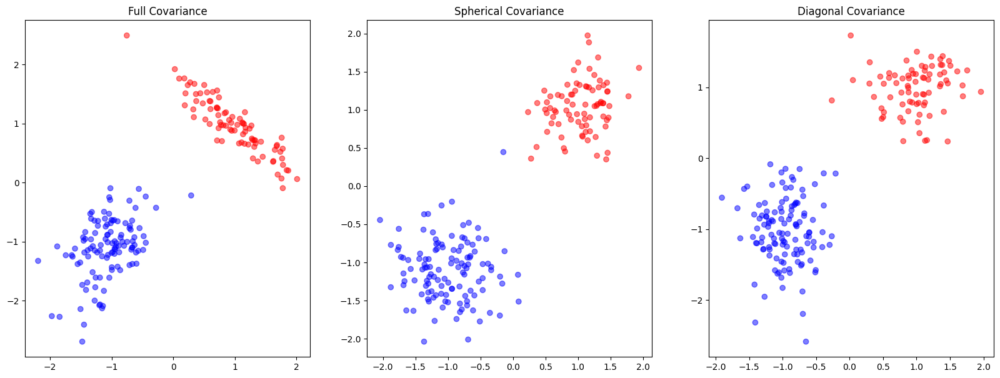

In [ ]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu1, mu2, sigma1, sigma2, N):
    ############################################################################
    #pi = weights of Gaussians, mu = mean of Gaussians, sigma = convariance of Gaussians, N = number of data points
    #Steps
    #1.Select th Gaussian following the probability distribution as pi
    #2.Sample the data points from the selected Gaussian
    #3.Repeat the process N times to get N data points
    #4.Return the sampled data
    ############################################################################
    #You may look into "random.choices" and "np.random.multivariate_normal" functions

    sample = np.random.choice(len(pi), N, p=pi)  # Select Gaussian component based on weights
    data = [[0,0]] * N
    labels = []

    for i in range(N):
        if sample[i] == 0:
            data[i] = np.random.multivariate_normal(mu1, sigma1)
        else:
            data[i] = np.random.multivariate_normal(mu2, sigma2)
        labels.append(sample[i])

    return np.asarray(data), np.asarray(labels)
    ############################################################################


############################################################################
#Chose the appropriate means ($\mu$), covariances ($\Sigma$), and weights
############################################################################
mu1 = np.array([-1,-1])   #Mean vector of component1 in GMM
sig1 = np.array([[0.15, 0.1], [0.1, 0.25]])   #Full covariance matrix of component1 in GMM
mu2 = np.array([1,1])   #Mean vector of component2 in GMM
sig2 = np.array([[0.3, -0.25], [-0.25, 0.25]])   #Full covariance matrix of component2 in GMM
pi = [0.6, 0.4]     #Prior probabilities

n_points = 100  #Number of points

# Spherical covariances
sig1_s = np.array([[0.2, 0], [0, 0.2]])  # Spherical covariance for component1
sig2_s = np.array([[0.1, 0], [0, 0.1]])  # Spherical covariance for component2
# Diagonal covariances
sig1_d = np.array([[0.1, 0], [0, 0.2]])
sig2_d = np.array([[0.2, 0], [0, 0.1]])

############################################################################
#Create the synthetic data set
############################################################################

data_full, labels_full = generateData(pi, mu1, mu2, sig1, sig2, 200)
data_sp, labels_sp = generateData(pi, mu1, mu2, sig1_s, sig2_s, 200)
data_dg, labels_dg = generateData(pi, mu1, mu2, sig1_d, sig2_d, 200)

############################################################################
#Plot the synthetic data set
############################################################################

fig, ax = plt.subplots(1,3, figsize=(20,7))

#Visualize the data sampled from the GMM with full covariance matrix
ax[0].set_title('Full Covariance')
ax[0].scatter(data_full[:, 0], data_full[:, 1], c=labels_full, cmap='bwr', alpha=0.5)
#Visualize the data sampled from the GMM with spherical covariance matrix
ax[1].set_title('Spherical Covariance')
ax[1].scatter(data_sp[:, 0], data_sp[:, 1], c=labels_sp, cmap='bwr', alpha=0.5)
#Visualize the data sampled from the GMM with diagonal covariance matrix
ax[2].set_title('Diagonal Covariance')
ax[2].scatter(data_dg[:, 0], data_dg[:, 1], c=labels_dg, cmap='bwr', alpha=0.5)
plt.show()


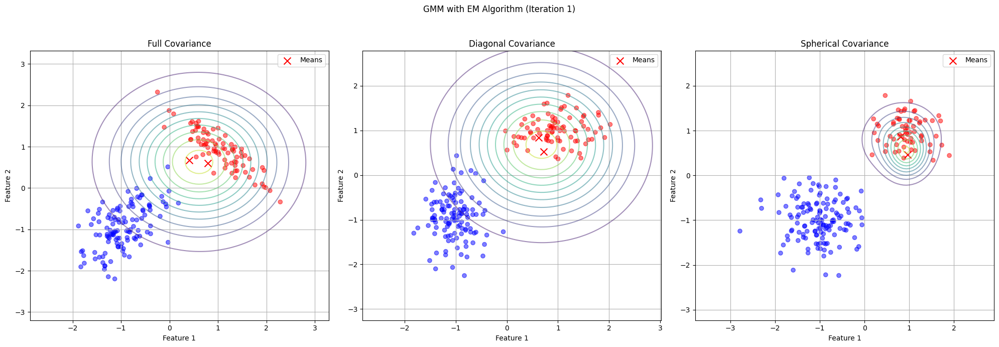

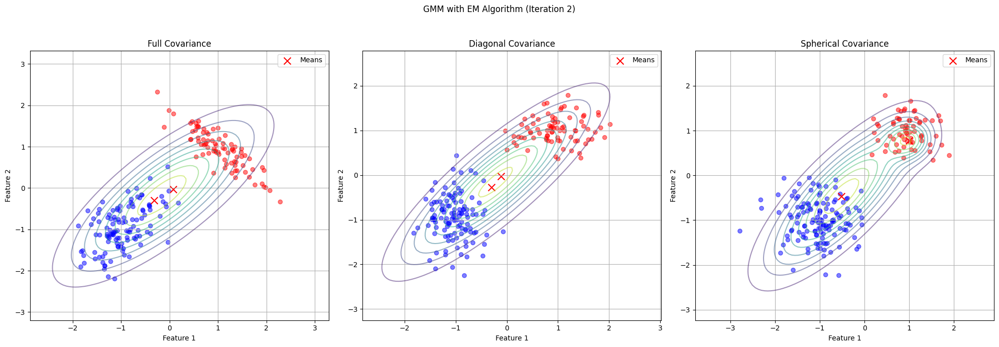

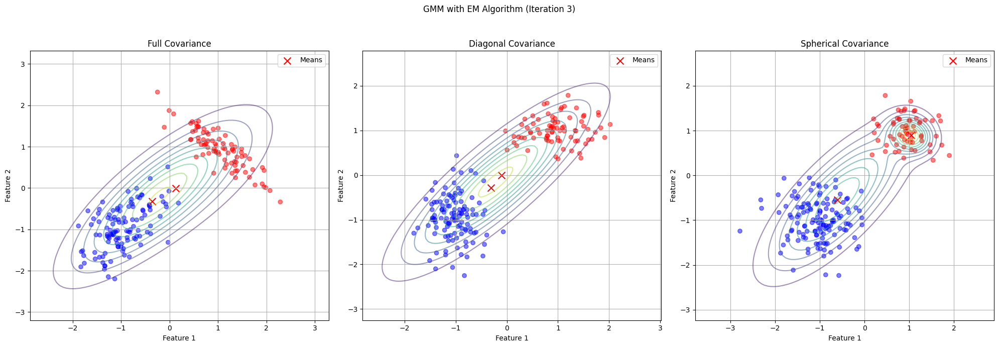

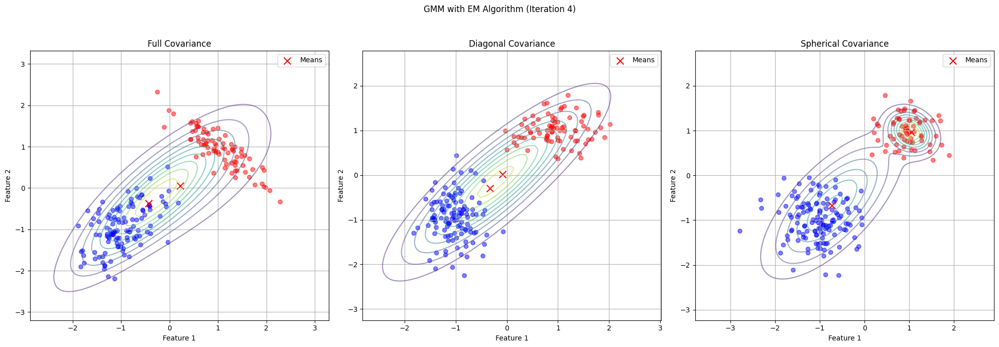

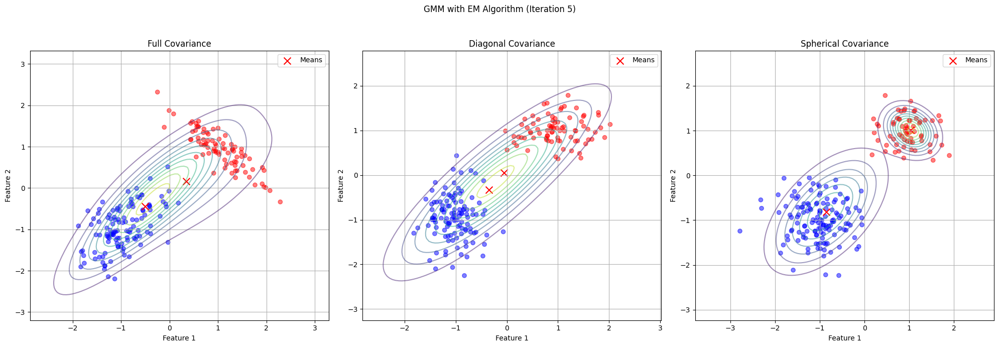

...

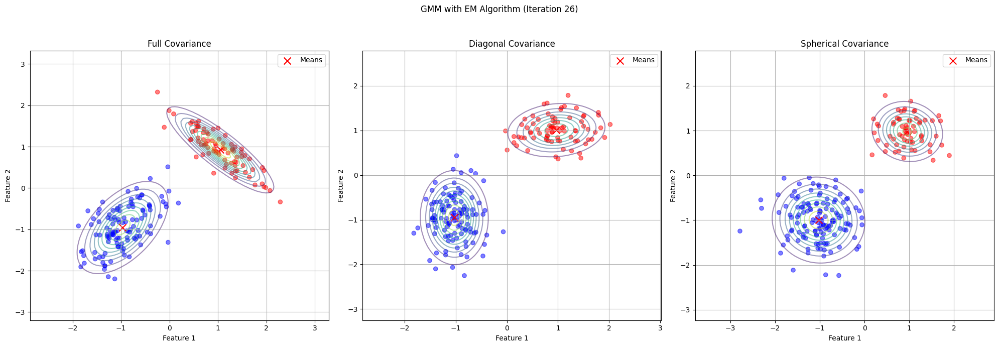

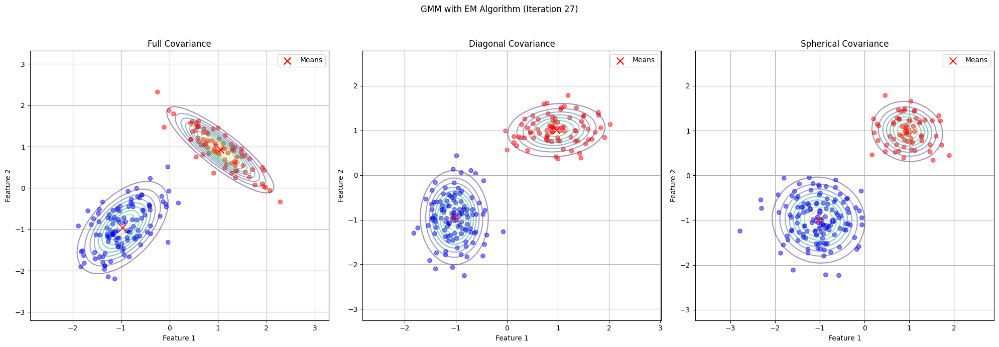

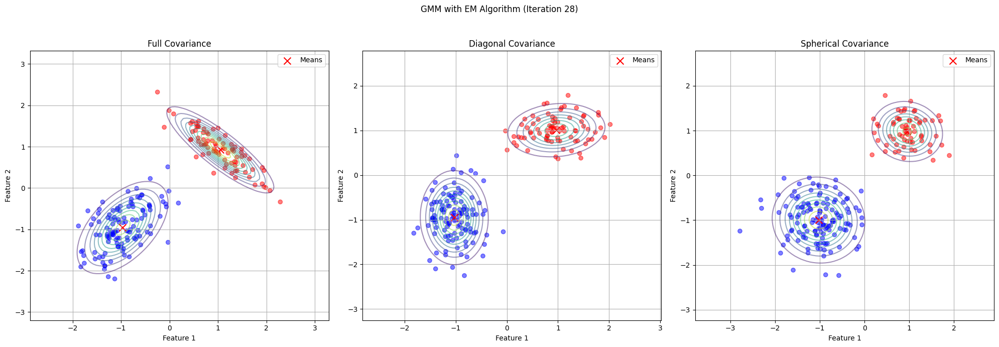

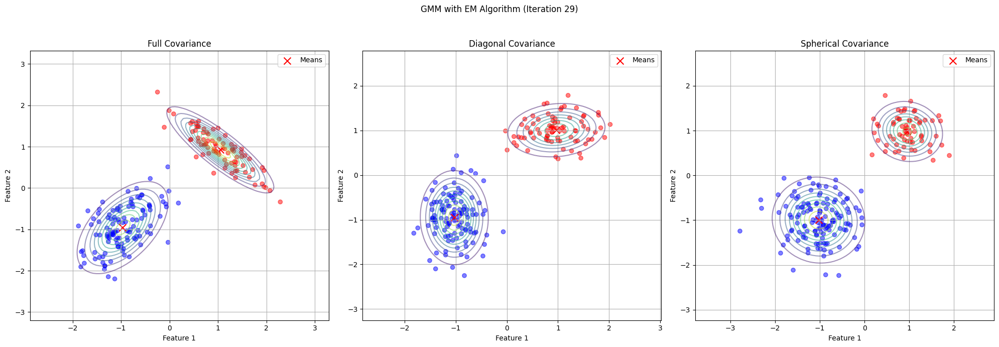

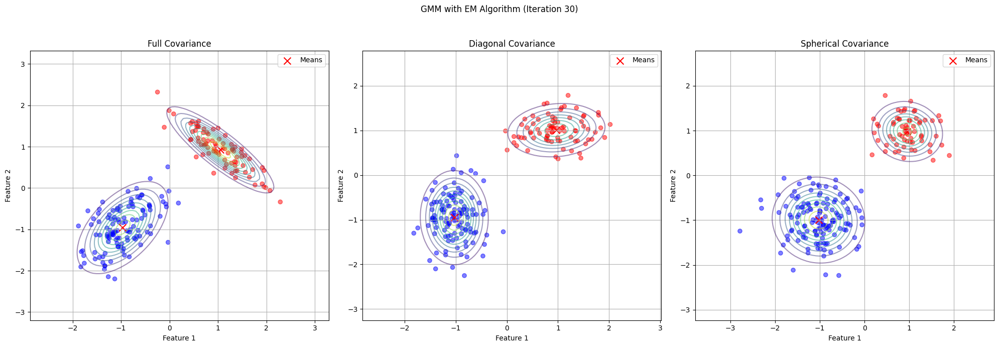

Final Parameters for Full Covariance:
Mixing Coefficients (pi): [0.41485825 0.58514175]
Means (mu): [[ 1.05041903  0.92338778]
 [-0.96663651 -0.95614115]]
Covariance Matrices (sigma): [[[ 0.25473826 -0.20814117]
  [-0.20814117  0.22646964]]

 [[ 0.19444632  0.12528277]
  [ 0.12528277  0.27472068]]]

Final Parameters for Diagonal Covariance:
Mixing Coefficients (pi): [0.40501788 0.59498212]
Means (mu): [[ 0.97000708  1.00530716]
 [-1.02690542 -0.95342613]]
Covariance Matrices (sigma): [[[ 0.21761626  0.01599479]
  [ 0.01599479  0.08589596]]

 [[ 0.09252037 -0.00109343]
  [-0.00109343  0.23434021]]]

Final Parameters for Spherical Covariance:
Mixing Coefficients (pi): [0.3249606 0.6750394]
Means (mu): [[ 0.95741363  0.98119273]
 [-1.02858643 -0.99776732]]
Covariance Matrices (sigma): [[[ 0.14687054 -0.01072808]
  [-0.01072808  0.10574796]]

 [[ 0.23372664 -0.00965624]
  [-0.00965624  0.20044282]]]


In [ ]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-b: Implimentation of Expectation-Maximization (EM) algorithm
##########################################

############################################################################
#Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False):
  #Inputs: data, parameters of GMM model
  #Outputs: likelihood

  log_likelihood = 0.0
  # print(sigma.shape)
  for n in range(data.shape[0]):
    #Iterate through the data points
    likelihood_n = 0.0
    for k in range(len(pi)):
      #Iterate through the components in GMM
      likelihood_n += pi[k] * multivariate_normal.pdf(data[n], mean=mu[k], cov=sigma[k])

    log_likelihood +=  np.log(likelihood_n)

  return log_likelihood if log_likelihood else likelihood


############################################################################
#Write a function for the expectation step
############################################################################
def expectation(data, pi, mu, sigma):
  #Inputs: data, parameters of GMM model
  #Outputs: gamma
  gamma = np.zeros((data.shape[0], len(pi)))  # Initialize the responsibilities matrix
  for n in range(len(data)):
    #Iterate through the data points
    for k in range(len(pi)):
      #Iterate through the components in GMM
      numerator = pi[k] * multivariate_normal.pdf(data[n], mean=mu[k], cov=sigma[k])
      denominator = np.sum(np.array([pi[j] * multivariate_normal.pdf(data[n], mean=mu[j], cov=sigma[j]) for j in range(len(pi))]))
      gamma[n,k] = numerator/denominator
  return gamma



############################################################################
#Write a function for the maximization step.
############################################################################
def maximization(data, gamma):
  #Inputs: data, gamma
  #Outputs: Updated parameters of GMM model

  N = np.sum(gamma, axis=0)  # effective number of points generated by each component
  M = len(N) # number of components

  # Update mixing coefficients (pi)
  pi = N / np.sum(N)

  # Update means (mu)
  mu = np.array([np.sum(gamma[:, k].reshape(-1,1) * data, axis=0) / N[k] for k in range(M)])

  sigma = np.array([np.sum(gamma[:, k].reshape(-1,1,1) * np.einsum('ij,ik->ijk', (data - mu[k]), (data - mu[k])), axis=0) / N[k] for k in range(M)])

  #Return the parameters of GMM model
  return pi, mu, sigma


#Complete the below function. It plots the contours
def plot_contours(data, labels, pi, mu, sigma, title, ax):
  # Create grid for contour plot
  x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
  y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
  xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
  grid = np.c_[xx.ravel(), yy.ravel()]

  # Compute GMM density for grid points
  Z = np.zeros((grid.shape[0], len(pi)))
  for k in range(len(pi)):
    Z[:, k] = pi[k] * multivariate_normal.pdf(grid, mean=mu[k], cov=sigma[k])
  Z = np.sum(Z, axis=1).reshape(xx.shape)

  ax.contour(xx, yy, Z, levels=10, cmap='viridis', alpha=0.5)  # Contour plot
  ax.scatter(data[:, 0], data[:, 1], c=labels, cmap='bwr', alpha=0.5)  # Data points
  ax.scatter(mu[:, 0], mu[:, 1], c='red', marker='x', s=100, label='Means')  # Means
  ax.set_title(title)
  ax.set_xlabel('Feature 1')
  ax.set_ylabel('Feature 2')
  ax.legend()
  ax.grid()

############################################################################
#Run the expectation and maximzation algorithm to estimate the parameters
############################################################################
rng = np.random.default_rng(45)

N = 200
D = 2 # data dimension
M = 2 # Number of components

nsteps = 30
data_full, labels_full = generateData(pi, mu1, mu2, sig1, sig2, N)
data_sp, labels_sp = generateData(pi, mu1, mu2, sig1_s, sig2_s, N)
data_dg, labels_dg = generateData(pi, mu1, mu2, sig1_d, sig2_d, N)

# Initialize parameters
pi_full = rng.random(M)  # Mixing coefficients
pi_full =  pi_full / np.sum(pi_full)  # Normalize to sum to 1
pi_diag = rng.random(M)  # Mixing coefficients
pi_diag = pi_diag / np.sum(pi_diag)  # Normalize to sum to 1
pi_spherical = rng.random(M)  # Mixing coefficients
pi_spherical = pi_spherical / np.sum(pi_spherical)  # Normalize to sum to 1

# print("Initial Mixing Coefficients (pi):", pi_full, pi_diag, pi_spherical)

mu_full = rng.random((M, D))  # Means
mu_diag = rng.random((M, D))  # Means
mu_spherical = rng.random((M, D))  # Means

sigma_full = np.array([[[1, 0], [0, 1]] for k in range(M)])   #Initialize the covariance matrices
sigma_diag = np.array([[[1, 0], [0, 1]] for k in range(M)])   #Initialize the covariance matrices
sigma_sph = np.array([[[1, 0], [0, 1]] for k in range(M)])  # Covariance matrices

for index in range(0,nsteps,1):

  #Compute the likelihood
  ll_full = likelihood(data_full, pi_full, mu_full, sigma_full, log_likelihood=True)
  ll_diag = likelihood(data_dg, pi_diag, mu_diag, sigma_diag, log_likelihood=True)
  ll_spherical = likelihood(data_sp, pi_spherical, mu_spherical, sigma_spherical, log_likelihood=True)

  #Plot the contours
  fig, ax = plt.subplots(1, 3, figsize=(20, 7))
  plot_contours(data_full, labels_full, pi_full, mu_full, sigma_full, 'Full Covariance', ax[0])
  plot_contours(data_dg, labels_dg, pi_diag, mu_diag, sigma_diag, 'Diagonal Covariance', ax[1])
  plot_contours(data_sp, labels_sp, pi_spherical, mu_spherical, sigma_spherical, 'Spherical Covariance', ax[2])

  plt.suptitle(f'GMM with EM Algorithm (Iteration {index + 1})')
  plt.tight_layout()
  plt.subplots_adjust(top=0.85)  # Adjust the top margin to fit the title
  plt.show()

  #Expectation step
  gamma_full = expectation(data_full, pi_full, mu_full, sigma_full)
  gamma_diag = expectation(data_dg, pi_diag, mu_diag, sigma_diag)
  gamma_spherical = expectation(data_sp, pi_spherical, mu_spherical, sigma_spherical)

  #Maximization step
  pi_full, mu_full, sigma_full = maximization(data_full, gamma_full)
  pi_diag, mu_diag, sigma_diag = maximization(data_dg, gamma_diag)
  pi_spherical, mu_spherical, sigma_spherical = maximization(data_sp, gamma_spherical)


print("Final Parameters for Full Covariance:")
print("Mixing Coefficients (pi):", pi_full)
print("Means (mu):", mu_full)
print("Covariance Matrices (sigma):", sigma_full)

print("\nFinal Parameters for Diagonal Covariance:")
print("Mixing Coefficients (pi):", pi_diag)
print("Means (mu):", mu_diag)
print("Covariance Matrices (sigma):", sigma_diag)

print("\nFinal Parameters for Spherical Covariance:")
print("Mixing Coefficients (pi):", pi_spherical)
print("Means (mu):", mu_spherical)
print("Covariance Matrices (sigma):", sigma_spherical)







<b> Report your observations </b>

1. Impact of Initialization on Convergence
 - Sensitivity to Initial Values:
    - The EM algorithm shows high sensitivity to initial parameter values. Poor initialization (e.g., random means far from true cluster centers) leads to:
    - Slow convergence (requires more iterations to stabilize)
    - Convergence to suboptimal local maxima (evident from overlapping clusters in early iterations)
    - Inconsistent final parameters across runs (observed in pi, mu, and sigma values)
- Early iteration plots show:
    - Misaligned cluster means (red 'x' markers far from true centers)
    - Overlapping decision boundaries for different components
    - As iterations progress, means and covariance matrices adjust toward better separation.

2. Impact of Covariance matrices
 - Full Covariance:
    - Accurately captures correlation between features (e.g., diagonal ellipses in plots).   
    - Requires more iterations due to higher parameter complexity.    
- Diagonal Covariance:    
    - Fails to model feature correlations but adapts to axis-aligned variance differences.    
    - Faster convergence than full covariance but suboptimal for correlated data.    
- Spherical Covariance:    
    - Over-regularizes clusters into circles, leading to underfitting.    
    - Fastest convergence due to fewer parameters but poorest fit (visible as overlapping circles in plots).

